# **Project 2: AutoEncoders and GANs**

This project involves using an AutoEncoder, Variational Autoencoder and a GAN. The data is the Y. Isaienkov LEGO Minigfigures pictures dataset. It has been split into train and test data, the train data having 4 different franchises (Star Wars, Harry Potter, Marvel and Jurassic World) and the test data has pictures from every franchise. In total, there are 494 pictures, 415 in train and 79 in test, so ~16% is test data.

# Table of Contents
* [Import](#Import)
* [Dataset](#Dataset)
* [Data Generator](#gen)
* [Autoencoder](#ae)
* [Variational Autoencoder](#vae)
* [GAN](#gan)

### Import  <a class="anchor" id="Import"></a>



In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import seaborn as sns
import os
import random
import torchvision
import cv2

from datasets import load_dataset

import optuna

%matplotlib inline

C:\Users\rvaal\anaconda3\envs\GAN\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import Dataset,DataLoader
from PIL import Image

In [3]:
from helper_train import train_autoencoder_v1,train_vae_v1
from helper_utils import set_deterministic, set_all_seeds
from helper_plotting import plot_training_loss
from helper_plotting import plot_generated_images,plot_latent_space_with_labels
from helper_stuff import *

In [4]:
import torch
import torch.nn as nn
import cv2 as cv
import torch.nn.functional as F
from albumentations.pytorch import ToTensorV2
import torchvision.transforms.functional as TF
import tensorflow as tf
import albumentations as A

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

From previous run:

Best hyperparameters: {'latent_dim': 189, 'lr_gen': 1.5079571870971633e-05, 'lr_discr': 8.667730309028803e-05, 'batch_size': 20, 'num_epochs': 7}

From current run:

Best hyperparameters: {'latent_dim': 189, 'lr_gen': 0.001221490964348859, 'lr_discr': 0.0003257527184873621, 'batch_size': 49, 'num_epochs': 6}

In [ ]:
# Hyperparameters
RANDOM_SEED = 123
LEARNING_RATE = 0.0005
BATCH_SIZE = 30
NUM_EPOCHS = 30
GAN_EPOCHS = 50
GENERATOR_LEARNING_RATE = 0.001221490964348859
DISCRIMINATOR_LEARNING_RATE = 0.0003257527184873621
IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS = 224, 224, 3

VALID_SIZE = 0.3
IMAGE_SIZE = (512,512)
TRAIN_BATCH_SIZE = 16
VALID_BATCH_SIZE = 1
TEST_BATCH_SIZE = 1

In [6]:
set_deterministic
set_all_seeds(RANDOM_SEED)

## **Dataset**  <a id="Dataset"></a>

In [7]:
import kagglehub
# Importing the dataset

# Download latest version
path = kagglehub.dataset_download("ihelon/lego-minifigures-classification")

print("Path to dataset files:", path) 

Path to dataset files: C:\Users\rvaal\.cache\kagglehub\datasets\ihelon\lego-minifigures-classification\versions\30


In [8]:
BASE_DIR = r"C:\Users\rvaal\.cache\kagglehub\datasets\ihelon\lego-minifigures-classification\versions\30"
PATH_INDEX = os.path.join(BASE_DIR, "index.csv")
PATH_TEST = os.path.join(BASE_DIR, "test.csv")
PATH_METADATA = os.path.join(BASE_DIR, "metadata.csv")

In [9]:
df_train = pd.read_csv(PATH_INDEX)
df_train = df_train.reset_index()
df_train

,index,path,class_id
0,0,marvel/0001/001.jpg,1
1,1,marvel/0001/002.jpg,1
2,2,marvel/0001/003.jpg,1
3,3,marvel/0001/004.jpg,1
4,4,marvel/0001/005.jpg,1
...,...,...,...
366,366,star-wars/0017/006.jpg,38
367,367,star-wars/0017/007.jpg,38
368,368,star-wars/0017/008.jpg,38
369,369,star-wars/0017/009.jpg,38


In [10]:
df_test = pd.read_csv(PATH_INDEX)

In [11]:
df_train["path"]= df_train["path"].str.replace("/","\\")  # replacing forward slash with backslash, so that it is possible to load the images

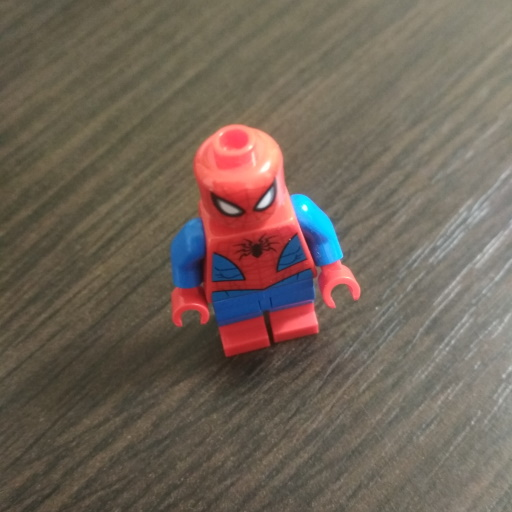

In [12]:
from PIL import Image
example = Image.open(BASE_DIR + "\\"+df_train["path"][0]) # Path to the first image, in this case the first Marvel image
example

### **Dataset Generation**  <a id="gen"></a>

Because the dataset only includes 500 images, we have to generate new images so that the autoencoder has something to train on.

In [13]:
# Read information about dataset
from sklearn import model_selection as sk_model_selection

tmp_train, tmp_valid = sk_model_selection.train_test_split(
    df_train, 
    test_size=VALID_SIZE, 
    random_state=RANDOM_SEED, 
    stratify=df_train['class_id'],
)


def get_paths_and_targets(tmp_df):
    # Get file paths
    paths = tmp_df["path"].values
    # Create full paths (base dir + concrete file name)
    paths = list(map(lambda x: os.path.join(BASE_DIR, x), paths))
    # Get labels
    targets = tmp_df["class_id"].values
    
    return paths, targets


# Get train file paths and targets
train_paths, train_targets = get_paths_and_targets(tmp_train)

# Get valid file paths and targets
valid_paths, valid_targets = get_paths_and_targets(tmp_valid)

df_test = pd.read_csv(PATH_TEST)
# Get test file paths and targets
test_paths, test_targets = get_paths_and_targets(df_test)

In [14]:
def get_train_transforms():
    return A.Compose(
        [
            A.Affine(
                p=1, 
                translate_percent=(-0.2, 0.2), 
                rotate=(-20, 20), 
                scale = (0.9,1),
                border_mode=4
            ),
            A.CoarseDropout(
                p=0.8, 
                num_holes_range = (1,50),
                hole_height_range=(1, 10),
                hole_width_range=(1, 10),
            ),
            A.CoarseDropout(
                p=0.8, 
                num_holes_range = (1,30),
                hole_height_range=(10, 10),
                hole_width_range=(10, 10),
                fill=255,
            ),
            A.HorizontalFlip(p=0.6),
            A.Illumination(
                mode='linear',
                intensity_range=(0.01, 0.2),
                effect_type='brighten',
               angle_range=(0, 10)
            ),
            A.Blur(p=0.6),
            A.RandomBrightnessContrast(p=1,
                                       brightness_limit=0.1,
                                       contrast_limit=0.1,
                                      ),  
            A.RandomGamma(gamma_limit=(95, 105),p=0.6),  
            A.ToFloat(),
            A.LongestMaxSize(IMAGE_HEIGHT),
            ToTensorV2(transpose_mask=False, p=1.0),
        ], 
        p=1.0
    )
def get_rest_transforms():
    return A.Compose(
        [
            A.LongestMaxSize(IMAGE_HEIGHT),
            ToTensorV2(transpose_mask=False, p=1.0),
        ], 
        p=1.0
    )

In [15]:
train_generator = DataGenerator(
    train_paths, 
    train_targets, 
    batch_size=TRAIN_BATCH_SIZE, 
    image_size=IMAGE_SIZE,
    shuffle=True, 
    transforms=get_train_transforms(),
)

# Initialize the valid data generator
valid_generator = DataGenerator(
    valid_paths, 
    valid_targets, 
    image_size=IMAGE_SIZE,
    batch_size=VALID_BATCH_SIZE, 
    shuffle=False,
    transforms=get_rest_transforms(),
)

# Initialize the test data generator
test_generator = DataGenerator(
    test_paths, 
    test_targets, 
    image_size=IMAGE_SIZE,
    batch_size=TEST_BATCH_SIZE, 
    shuffle=False,
    transforms=get_rest_transforms(),
)

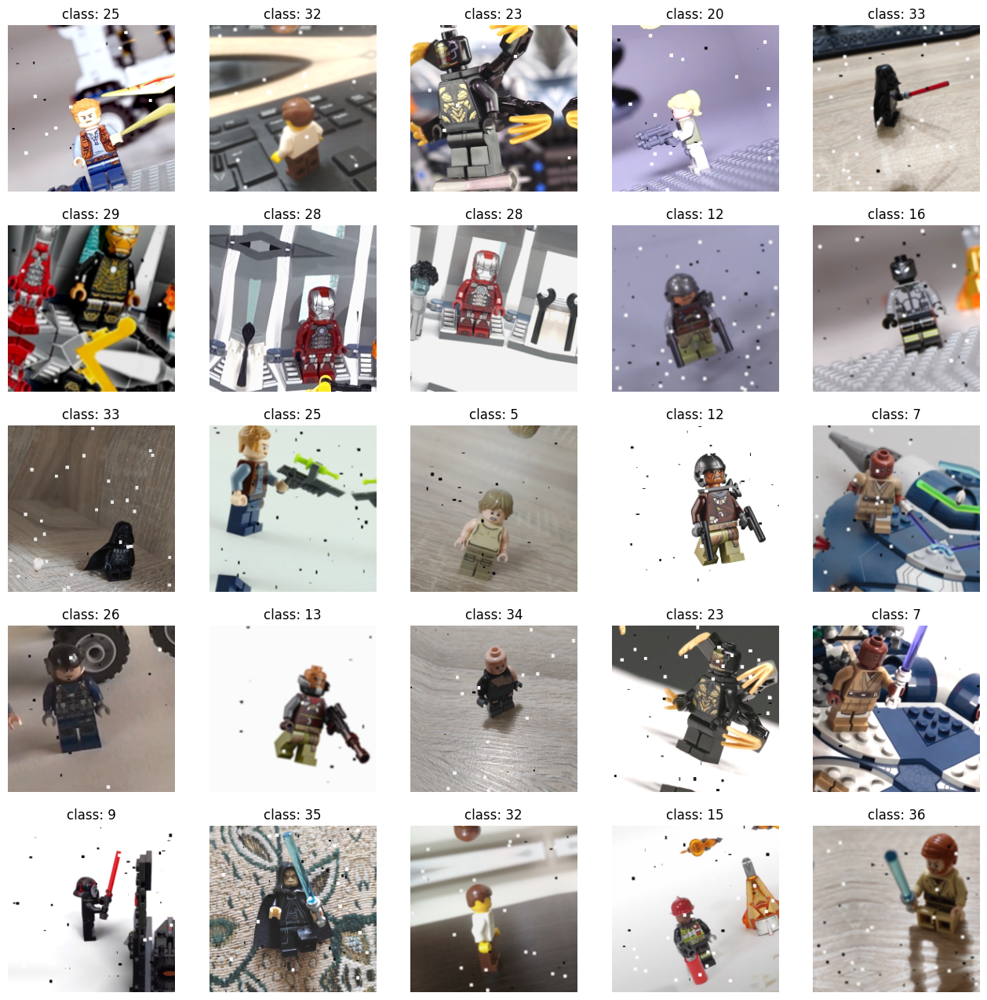

In [16]:
# Let's visualize some batches of the train data
plt.figure(figsize=(16, 16))
ind = 0
for i_batch in range(len(train_generator)):
    images, labels = train_generator[i_batch]
    for i in range(len(images)):
        plt.subplot(5, 5, ind + 1)
        ind += 1
        plt.imshow(TF.to_pil_image(images[i]))
        plt.title(f"class: {labels[i]}")
        plt.axis("off")
        if ind >= 25:
            break
    if ind >= 25:
        break

plt.show()

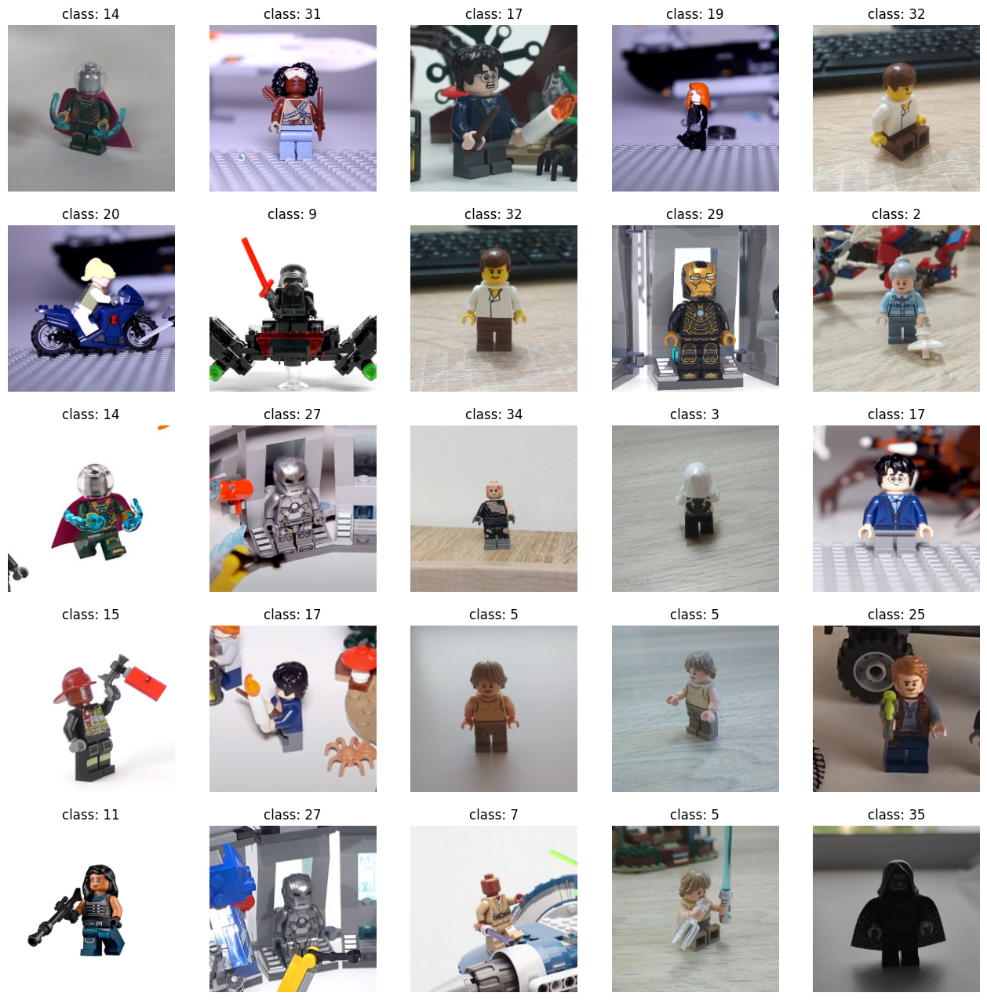

In [17]:
plt.figure(figsize=(16, 16))
ind = 0
for i_batch in range(len(valid_generator)):
    images, labels = valid_generator[i_batch]
    for i in range(len(images)):
        plt.subplot(5, 5, ind + 1)
        ind += 1
        plt.imshow(TF.to_pil_image(images[i]))
        plt.title(f"class: {labels[i]}")
        plt.axis("off")
        if ind >= 25:
            break
    if ind >= 25:
        break

plt.show()

In [18]:
train_loader = DataLoader(train_generator, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(valid_generator, batch_size=BATCH_SIZE)
test_loader = DataLoader(test_generator, batch_size=BATCH_SIZE)

In [19]:
# Checking the dataset
print('Training Set:\n')
for images, labels in train_loader:  
    print('Image batch dimensions:', images.permute(0,1,3,4,2).size())
    print('Image label dimensions:', labels.size())
    print(labels[:10])
    break

print('\nValidating Set:')
for images, labels in val_loader:  
    print('Image batch dimensions:', images.size())
    print('Image label dimensions:', labels.size())
    print(labels[:10])
    break
# Checking the dataset
print('\nTesting Set:')
for images, labels in test_loader:  
    print('Image batch dimensions:', images.size())
    print('Image label dimensions:', labels.size())
    print(labels[:10])
    break

Training Set:

Image batch dimensions: torch.Size([16, 16, 224, 224, 3])
Image label dimensions: torch.Size([16, 16])
tensor([[ 5,  4, 37, 16, 32, 26, 20, 34, 19, 21,  6,  1,  1,  3,  9, 37],
        [19, 35, 32, 27, 14, 15,  9, 13, 27, 28, 14,  3,  8,  3, 36,  2],
        [ 0,  5, 30, 18,  5, 13, 17, 24,  5, 11,  8, 19, 10,  6, 31, 16],
        [17, 21,  0, 25,  7, 14, 19, 17, 37,  4, 27, 22,  6, 17, 32, 27],
        [13, 34, 23,  7,  9, 35, 32, 15, 36, 28, 17, 17, 16, 18, 36, 34],
        [36,  7, 25, 18,  2, 29, 29, 17, 34,  8,  0,  8,  6, 36,  6, 29],
        [16, 20,  0, 10, 25, 12, 11, 34,  6, 20, 28, 22, 26, 34,  5,  1],
        [30, 22, 35,  2, 26, 33, 23,  3, 21,  8,  0,  4, 18, 10, 25,  2],
        [25, 32, 23, 20, 33, 29, 28, 28, 12, 16, 33, 25,  5, 12,  7, 26],
        [26, 20, 30, 22, 11, 23, 27, 31, 33, 28, 30, 26, 30,  6, 18, 20]])

Validating Set:
Image batch dimensions: torch.Size([20, 1, 3, 224, 224])
Image label dimensions: torch.Size([20, 1])
tensor([[14],
        [

The Dataset has the size (Batch size, data generator batch size, alpha channel, height, width). The models expect the size (batch size, alpha channel, height, width) so the dataset has to be permuted, flipping the first two dimensions.

## **Autoencoder**  <a id="ae"></a>

In [20]:
##########################
### MODEL
##########################


class Reshape(nn.Module):
    def __init__(self, *args):
        super().__init__()
        self.shape = args

    def forward(self, x):
        return x.view(self.shape)


class Trim(nn.Module):
    def __init__(self, *args):
        super().__init__()

    def forward(self, x):
        return x[:, :, :224, :224]


class AutoEncoder(nn.Module):
    def __init__(self):
        super().__init__()
        
        # Encoder
        self.encoder = nn.Sequential( 
            nn.Conv2d(3, 64, stride=1, kernel_size=3, padding=1), 
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.01),
            nn.Conv2d(64, 128, stride=2, kernel_size=3, padding=1),  
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.01),
            nn.Conv2d(128, 128, stride=2, kernel_size=3, padding=1),  
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.01),
            nn.Conv2d(128, 128, stride=1, kernel_size=3, padding=1),  
            nn.Conv2d(128, 256, stride=2, kernel_size=3, padding=1), 
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.01),
            nn.Flatten(),
            nn.Linear(256 * 28 * 28, 4)  
        )
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(4, 256 * 28 * 28),  
            nn.LeakyReLU(0.01),
            Reshape(-1, 256, 28, 28),  
            nn.ConvTranspose2d(256, 128, stride=2, kernel_size=4, padding=1), 
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.01),
            nn.ConvTranspose2d(128, 64, stride=2, kernel_size=3, padding=1),  
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.01),
            nn.ConvTranspose2d(64, 32, stride=2, kernel_size=3, padding=0), 
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.01),
            nn.ConvTranspose2d(32, 3, stride=1, kernel_size=3, padding=0),  
            Trim(),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x



In [21]:
model = AutoEncoder()
model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)  

In [22]:
log_dict = train_autoencoder_v1(num_epochs=NUM_EPOCHS, model=model, 
                                optimizer=optimizer, device=device, 
                                train_loader=train_loader,
                                skip_epoch_stats=True,
                                logging_interval=250)

Epoch: 001/030 | Batch 0000/0001 | Loss: 0.1766
Epoch: 001/030 | Batch 0000/0001 | Loss: 0.1546
Epoch: 001/030 | Batch 0000/0001 | Loss: 0.1436
Epoch: 001/030 | Batch 0000/0001 | Loss: 0.1235
Epoch: 001/030 | Batch 0000/0001 | Loss: 0.1330
Epoch: 001/030 | Batch 0000/0001 | Loss: 0.1018
Epoch: 001/030 | Batch 0000/0001 | Loss: 0.1097
Epoch: 001/030 | Batch 0000/0001 | Loss: 0.0781
Epoch: 001/030 | Batch 0000/0001 | Loss: 0.0761
Epoch: 001/030 | Batch 0000/0001 | Loss: 0.0797
Epoch: 001/030 | Batch 0000/0001 | Loss: 0.0780
Epoch: 001/030 | Batch 0000/0001 | Loss: 0.0789
Epoch: 001/030 | Batch 0000/0001 | Loss: 0.0591
Epoch: 001/030 | Batch 0000/0001 | Loss: 0.0659
Epoch: 001/030 | Batch 0000/0001 | Loss: 0.0554
Epoch: 001/030 | Batch 0000/0001 | Loss: 0.0486
Time elapsed: 0.09 min
Epoch: 002/030 | Batch 0000/0001 | Loss: 0.0740
Epoch: 002/030 | Batch 0000/0001 | Loss: 0.0633
Epoch: 002/030 | Batch 0000/0001 | Loss: 0.0854
Epoch: 002/030 | Batch 0000/0001 | Loss: 0.0626
Epoch: 002/030 | 

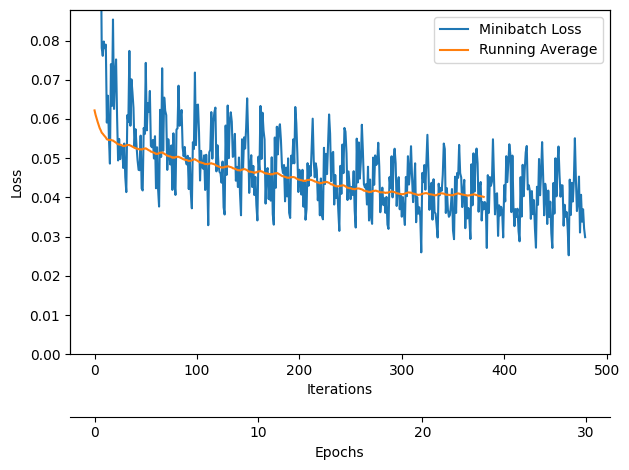

In [23]:
plot_training_loss(log_dict['train_loss_per_batch'], NUM_EPOCHS)
plt.show()

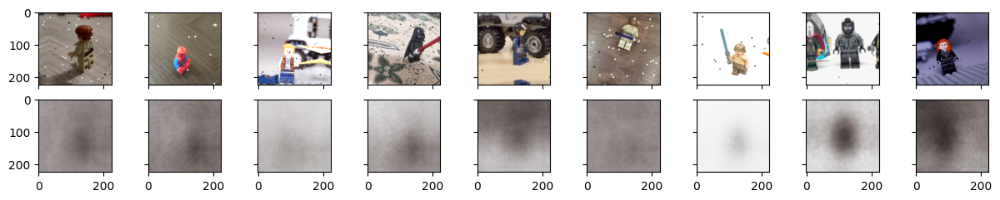

In [24]:
plot_generated_images(data_loader=train_loader, model=model, device=device)  
plt.show()

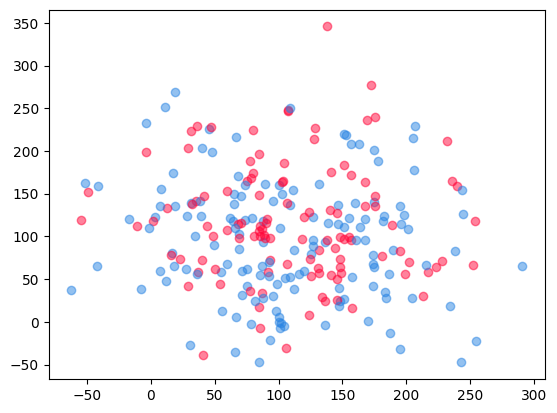

In [25]:
plot_latent_space_with_labels(
    num_classes=39,
    data_loader=train_loader,
    model=model, 
    device=device)
plt.show()

The colors are set based on the franchise, Marvel is red, Star Wars is blue, Harry Potter is yellow and Jurassic World is green.

## **Variational Autoencoder**   <a id="vae"></a>

In [31]:
##########################
### MODEL
##########################


class Reshape(nn.Module):
    def __init__(self, *args):
        super().__init__()
        self.shape = args

    def forward(self, x):
        return x.view(self.shape)


class Trim(nn.Module):
    def __init__(self, *args):
        super().__init__()

    def forward(self, x):
        return x[:, :, :224, :224]


class VAE(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.encoder = nn.Sequential(
                nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),  # Output: (16, 64, 224, 224)
                nn.BatchNorm2d(64),
                nn.LeakyReLU(0.01),
                nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),  # Output: (16, 128, 112, 112)
                nn.BatchNorm2d(128),
                nn.LeakyReLU(0.01),
                nn.Conv2d(128, 128, kernel_size=3, stride=2, padding=1),  # Output: (16, 128, 56, 56)
                nn.BatchNorm2d(128),
                nn.LeakyReLU(0.01),
                nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),  # Output: (16, 256, 28, 28)
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01),
                nn.Conv2d(256, 256, kernel_size=3, stride=2, padding=1),  # Output: (16, 256, 14, 14)
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01),
                nn.Conv2d(256, 256, kernel_size=3, stride=2, padding=1),  # Output: (16, 256, 7, 7)
                nn.Flatten(),  # Output: (16, 256 * 7 * 7)
        )    
        
        self.z_mean = nn.Linear(12544, 4)
        self.z_log_var = nn.Linear(12544, 4)
        
        self.decoder = nn.Sequential(
                nn.Linear(4,12544),  
                nn.LeakyReLU(0.01),
                Reshape(-1, 256, 7, 7),  # Reshape to match the encoder's downsampling
                nn.ConvTranspose2d(256, 128, stride=2, kernel_size=4, padding=1), 
                nn.BatchNorm2d(128),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(128, 64, stride=2, kernel_size=4, padding=1),  
                nn.BatchNorm2d(64),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(64, 32, stride=2, kernel_size=4, padding=1), 
                nn.BatchNorm2d(32),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(32, 16, stride=2, kernel_size=4, padding=1), 
                nn.BatchNorm2d(16),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(16, 3, stride=2, kernel_size=4, padding=1),
                Trim(),
                nn.Sigmoid()
                )

    def encoding_fn(self, x):
        x = self.encoder(x)
        z_mean, z_log_var = self.z_mean(x), self.z_log_var(x)
        encoded = self.reparameterize(z_mean, z_log_var)
        return encoded
        
    def reparameterize(self, z_mu, z_log_var):
        eps = torch.randn(z_mu.size(0), z_mu.size(1)).to(z_mu.get_device())
        z = z_mu + eps * torch.exp(z_log_var/2.) 
        return z
        
    def forward(self, x):
        encoded = self.encoding_fn(x)
        x = self.encoder(x)
        decoded = self.decoder(encoded)
        z_mean, z_log_var = self.z_mean(x), self.z_log_var(x)  
        return encoded, z_mean, z_log_var, decoded

In [32]:
model2 = VAE()
model2.to(device)

optimizer = torch.optim.Adam(model2.parameters(), lr=LEARNING_RATE) 

In [33]:
log_dict = train_vae_v1(num_epochs=NUM_EPOCHS, model=model2, 
                        optimizer=optimizer, device=device, 
                        train_loader=train_loader,
                        skip_epoch_stats=True,
                        logging_interval=50)

Epoch: 001/030 | Batch 0000/0001 | Loss: 15873.3896
Epoch: 001/030 | Batch 0000/0001 | Loss: 13367.5908
Epoch: 001/030 | Batch 0000/0001 | Loss: 15890.2031
Epoch: 001/030 | Batch 0000/0001 | Loss: 13456.4033
Epoch: 001/030 | Batch 0000/0001 | Loss: 14167.9824
Epoch: 001/030 | Batch 0000/0001 | Loss: 13961.0850
Epoch: 001/030 | Batch 0000/0001 | Loss: 14397.2227
Epoch: 001/030 | Batch 0000/0001 | Loss: 12603.9082
Epoch: 001/030 | Batch 0000/0001 | Loss: 13930.2520
Epoch: 001/030 | Batch 0000/0001 | Loss: 15960.9150
Epoch: 001/030 | Batch 0000/0001 | Loss: 13831.2803
Epoch: 001/030 | Batch 0000/0001 | Loss: 11013.8291
Epoch: 001/030 | Batch 0000/0001 | Loss: 10021.5107
Epoch: 001/030 | Batch 0000/0001 | Loss: 14108.3447
Epoch: 001/030 | Batch 0000/0001 | Loss: 11321.2100
Epoch: 001/030 | Batch 0000/0001 | Loss: 12399.4688
Time elapsed: 0.09 min
Epoch: 002/030 | Batch 0000/0001 | Loss: 12173.8174
Epoch: 002/030 | Batch 0000/0001 | Loss: 13382.5049
Epoch: 002/030 | Batch 0000/0001 | Loss: 

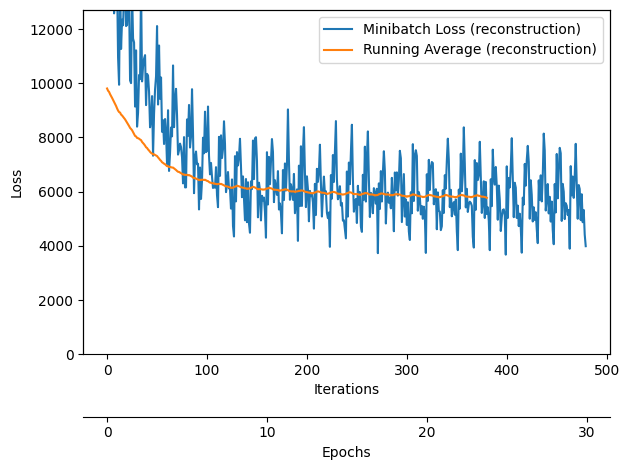

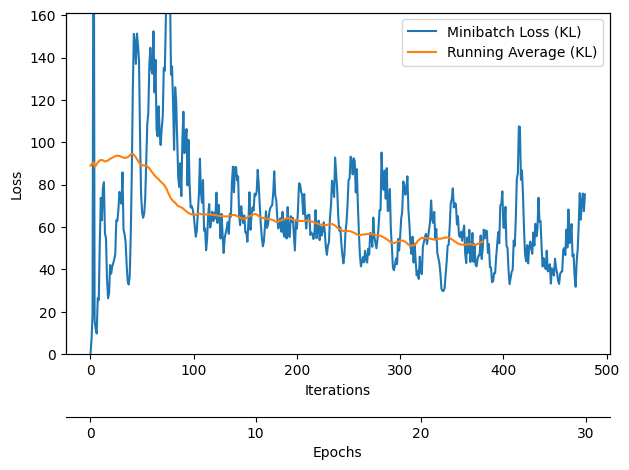

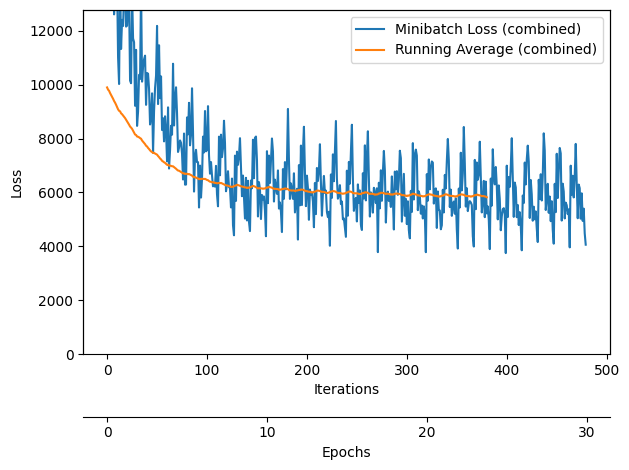

In [34]:
plot_training_loss(log_dict['train_reconstruction_loss_per_batch'], NUM_EPOCHS, custom_label=" (reconstruction)")
plot_training_loss(log_dict['train_kl_loss_per_batch'], NUM_EPOCHS, custom_label=" (KL)")
plot_training_loss(log_dict['train_combined_loss_per_batch'], NUM_EPOCHS, custom_label=" (combined)")
plt.show()

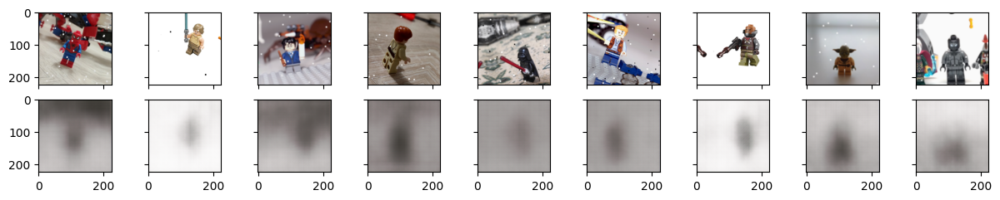

In [35]:
plot_generated_images(data_loader=train_loader, model=model2, device=device, modeltype='VAE')     
plt.show()

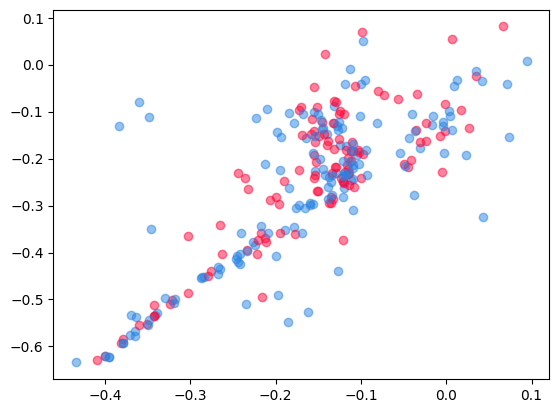

In [36]:
plot_latent_space_with_labels(
    num_classes=38,
    data_loader=train_loader,
    model = model2,
    device=device)

plt.show()

## **GAN** <a id="gan"></a>

In [37]:
##########################
### MODEL
##########################
import torch
import torch.nn as nn

class GAN(nn.Module):
    def __init__(self, latent_dim=189, image_height=224, image_width=224, color_channels=3):
        super().__init__()
        
        self.image_height = image_height
        self.image_width = image_width
        self.color_channels = color_channels
        self.latent_dim = latent_dim
        
        # Generator
        self.generator = nn.Sequential(
            nn.Linear(self.latent_dim, 256),  # First layer expects (batch_size, latent_dim)
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Linear(256, 512),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Linear(512, self.color_channels * self.image_height * self.image_width),
            nn.Tanh()
        )
        
        # Discriminator
        self.discriminator = nn.Sequential(
            nn.Flatten(),
            nn.Linear(self.color_channels * self.image_height * self.image_width, 512),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Linear(256, 1)
        )
    
    def generator_forward(self, z):
        # Ensure z has the correct latent dimension (batch_size, latent_dim)
        if z.dim() == 4:  # (batch_size, latent_dim, 1, 1)
            z = z.view(z.size(0), -1)  # Flatten it to (batch_size, latent_dim)
        
        img = self.generator(z)
        
        # Reshape the output to (batch_size, color_channels, image_height, image_width)
        img = img.view(z.size(0), self.color_channels, self.image_height, self.image_width)
        return img
    
    def discriminator_forward(self, img):
        logits = self.discriminator(img)
        return logits

In [38]:
modelGAN = GAN()
modelGAN.to(device)


optim_gen = torch.optim.Adam(modelGAN.generator.parameters(),
                             betas=(0.5, 0.999),
                             lr=GENERATOR_LEARNING_RATE)

optim_discr = torch.optim.Adam(modelGAN.discriminator.parameters(),
                               betas=(0.5, 0.999),
                               lr=DISCRIMINATOR_LEARNING_RATE)

In [40]:
import optuna
import torch.optim as optim

# Define the objective function for Optuna
def objective(trial):
    latent_dim = trial.suggest_int('latent_dim', 100, 200)
    lr_gen = trial.suggest_loguniform('lr_gen', 1e-5, 1e-2)
    lr_discr = trial.suggest_loguniform('lr_discr', 1e-5, 1e-2)
    batch_size = trial.suggest_int('batch_size', 16, 64)
    num_epochs = trial.suggest_int('num_epochs', 1, 20)
    
    # Initialize the model, optimizers
    model = GAN(latent_dim=latent_dim).to(device)
    optimizer_gen = optim.Adam(model.generator.parameters(), lr=lr_gen, betas=(0.5, 0.999))
    optimizer_discr = optim.Adam(model.discriminator.parameters(), lr=lr_discr, betas=(0.5, 0.999))
    
    # Training loop 
    log_dict = train_gan_v1(
        num_epochs=num_epochs,
        model=model,
        optimizer_gen=optimizer_gen,
        optimizer_discr=optimizer_discr,
        latent_dim=latent_dim,
        device=device,
        train_loader=train_loader,
        logging_interval=100
    )
    
    # Return the discriminator loss as the objective for Optuna
    return log_dict['train_discriminator_loss_per_batch'][-1]

# Create a study and optimize
study = optuna.create_study(direction='minimize')  # Minimize the discriminator loss
study.optimize(objective, n_trials=10)  # Number of trials to run

# Print the best hyperparameters
print(f"Best hyperparameters: {study.best_params}")


[I 2025-01-13 12:29:35,929] A new study created in memory with name: no-name-84cb5e75-cd57-42bc-95ef-770f8ebe8070
C:\Users\rvaal\AppData\Local\Temp\ipykernel_22704\3781775788.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr_gen = trial.suggest_loguniform('lr_gen', 1e-5, 1e-2)
C:\Users\rvaal\AppData\Local\Temp\ipykernel_22704\3781775788.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr_discr = trial.suggest_loguniform('lr_discr', 1e-5, 1e-2)


Epoch: 1/19 | Batch: 0/1 | Gen Loss (Avg): 0.0090 | Dis Loss (Avg): 0.0069 | Real Acc: 75.00% | Fake Acc: 100.00%
Epoch: 1/19 | Batch: 0/1 | Gen Loss (Avg): 0.0260 | Dis Loss (Avg): 0.0153 | Real Acc: 87.50% | Fake Acc: 100.00%
Epoch: 1/19 | Batch: 0/1 | Gen Loss (Avg): 0.0567 | Dis Loss (Avg): 0.0163 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/19 | Batch: 0/1 | Gen Loss (Avg): 0.1001 | Dis Loss (Avg): 0.0164 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/19 | Batch: 0/1 | Gen Loss (Avg): 0.1510 | Dis Loss (Avg): 0.0163 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/19 | Batch: 0/1 | Gen Loss (Avg): 0.2041 | Dis Loss (Avg): 0.0162 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/19 | Batch: 0/1 | Gen Loss (Avg): 0.2558 | Dis Loss (Avg): 0.0161 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/19 | Batch: 0/1 | Gen Loss (Avg): 0.3039 | Dis Loss (Avg): 0.0160 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/19 | Batch: 0/1 | Gen Loss (Avg): 0.3484 | Dis Loss (Avg): 0.0160 | Real 

[I 2025-01-13 12:30:57,526] Trial 0 finished with value: 0.5359116051540715 and parameters: {'latent_dim': 176, 'lr_gen': 0.0001836872559754816, 'lr_discr': 0.0010086100436401011, 'batch_size': 40, 'num_epochs': 19}. Best is trial 0 with value: 0.5359116051540715.


Time elapsed: 1.35 min
Total Training Time: 1.35 min
Epoch: 1/18 | Batch: 0/1 | Gen Loss (Avg): 0.0097 | Dis Loss (Avg): 0.0070 | Real Acc: 0.00% | Fake Acc: 100.00%
Epoch: 1/18 | Batch: 0/1 | Gen Loss (Avg): 0.0153 | Dis Loss (Avg): 0.0331 | Real Acc: 87.50% | Fake Acc: 0.00%
Epoch: 1/18 | Batch: 0/1 | Gen Loss (Avg): 0.0403 | Dis Loss (Avg): 0.0580 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/18 | Batch: 0/1 | Gen Loss (Avg): 0.0474 | Dis Loss (Avg): 0.0919 | Real Acc: 37.50% | Fake Acc: 100.00%
Epoch: 1/18 | Batch: 0/1 | Gen Loss (Avg): 0.0719 | Dis Loss (Avg): 0.1053 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/18 | Batch: 0/1 | Gen Loss (Avg): 0.0766 | Dis Loss (Avg): 0.1265 | Real Acc: 56.25% | Fake Acc: 0.00%
Epoch: 1/18 | Batch: 0/1 | Gen Loss (Avg): 0.0879 | Dis Loss (Avg): 0.1401 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/18 | Batch: 0/1 | Gen Loss (Avg): 0.1048 | Dis Loss (Avg): 0.1491 | Real Acc: 93.75% | Fake Acc: 100.00%
Epoch: 1/18 | Batch: 0/1 | Gen Loss (

[I 2025-01-13 12:32:12,307] Trial 1 finished with value: 0.6037378536689132 and parameters: {'latent_dim': 142, 'lr_gen': 0.0031240825509457324, 'lr_discr': 0.0006767615263879749, 'batch_size': 41, 'num_epochs': 18}. Best is trial 0 with value: 0.5359116051540715.


Epoch: 18/18 | Batch: 0/1 | Gen Loss (Avg): 0.8682 | Dis Loss (Avg): 0.6049 | Real Acc: 43.75% | Fake Acc: 81.25%
Epoch: 18/18 | Batch: 0/1 | Gen Loss (Avg): 0.8699 | Dis Loss (Avg): 0.6037 | Real Acc: 93.75% | Fake Acc: 93.75%
Time elapsed: 1.24 min
Total Training Time: 1.24 min
Epoch: 1/20 | Batch: 0/1 | Gen Loss (Avg): 0.0086 | Dis Loss (Avg): 0.0070 | Real Acc: 0.00% | Fake Acc: 100.00%
Epoch: 1/20 | Batch: 0/1 | Gen Loss (Avg): 0.0144 | Dis Loss (Avg): 0.0182 | Real Acc: 87.50% | Fake Acc: 0.00%
Epoch: 1/20 | Batch: 0/1 | Gen Loss (Avg): 0.0196 | Dis Loss (Avg): 0.0325 | Real Acc: 93.75% | Fake Acc: 0.00%
Epoch: 1/20 | Batch: 0/1 | Gen Loss (Avg): 0.0367 | Dis Loss (Avg): 0.0438 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/20 | Batch: 0/1 | Gen Loss (Avg): 0.0453 | Dis Loss (Avg): 0.0554 | Real Acc: 68.75% | Fake Acc: 100.00%
Epoch: 1/20 | Batch: 0/1 | Gen Loss (Avg): 0.0583 | Dis Loss (Avg): 0.0640 | Real Acc: 93.75% | Fake Acc: 100.00%
Epoch: 1/20 | Batch: 0/1 | Gen Loss (Av

[I 2025-01-13 12:33:34,607] Trial 2 finished with value: 0.6162875334934653 and parameters: {'latent_dim': 134, 'lr_gen': 0.0023811723703831395, 'lr_discr': 0.00035026627100548407, 'batch_size': 38, 'num_epochs': 20}. Best is trial 0 with value: 0.5359116051540715.


Epoch: 20/20 | Batch: 0/1 | Gen Loss (Avg): 0.8695 | Dis Loss (Avg): 0.6163 | Real Acc: 93.75% | Fake Acc: 100.00%
Time elapsed: 1.36 min
Total Training Time: 1.36 min
Epoch: 1/20 | Batch: 0/1 | Gen Loss (Avg): 0.0014 | Dis Loss (Avg): 0.0070 | Real Acc: 18.75% | Fake Acc: 0.00%
Epoch: 1/20 | Batch: 0/1 | Gen Loss (Avg): 0.3306 | Dis Loss (Avg): 0.0177 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/20 | Batch: 0/1 | Gen Loss (Avg): 0.7466 | Dis Loss (Avg): 0.0335 | Real Acc: 93.75% | Fake Acc: 100.00%
Epoch: 1/20 | Batch: 0/1 | Gen Loss (Avg): 1.2043 | Dis Loss (Avg): 0.0332 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/20 | Batch: 0/1 | Gen Loss (Avg): 1.6696 | Dis Loss (Avg): 0.0328 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/20 | Batch: 0/1 | Gen Loss (Avg): 2.1250 | Dis Loss (Avg): 0.0325 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/20 | Batch: 0/1 | Gen Loss (Avg): 2.5606 | Dis Loss (Avg): 0.0322 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/20 | Batch: 0/1 | Gen 

[I 2025-01-13 12:34:57,088] Trial 3 finished with value: 8.64641719928837 and parameters: {'latent_dim': 175, 'lr_gen': 6.0500688804195905e-05, 'lr_discr': 0.0047275412738452946, 'batch_size': 53, 'num_epochs': 20}. Best is trial 0 with value: 0.5359116051540715.


Epoch: 20/20 | Batch: 0/1 | Gen Loss (Avg): 6.5940 | Dis Loss (Avg): 8.7160 | Real Acc: 81.25% | Fake Acc: 100.00%
Epoch: 20/20 | Batch: 0/1 | Gen Loss (Avg): 6.5331 | Dis Loss (Avg): 8.6464 | Real Acc: 93.75% | Fake Acc: 6.25%
Time elapsed: 1.36 min
Total Training Time: 1.36 min
Epoch: 1/6 | Batch: 0/1 | Gen Loss (Avg): 0.0077 | Dis Loss (Avg): 0.0069 | Real Acc: 93.75% | Fake Acc: 100.00%
Epoch: 1/6 | Batch: 0/1 | Gen Loss (Avg): 0.0137 | Dis Loss (Avg): 0.0195 | Real Acc: 81.25% | Fake Acc: 0.00%
Epoch: 1/6 | Batch: 0/1 | Gen Loss (Avg): 0.0196 | Dis Loss (Avg): 0.0299 | Real Acc: 93.75% | Fake Acc: 0.00%
Epoch: 1/6 | Batch: 0/1 | Gen Loss (Avg): 0.0285 | Dis Loss (Avg): 0.0402 | Real Acc: 93.75% | Fake Acc: 100.00%
Epoch: 1/6 | Batch: 0/1 | Gen Loss (Avg): 0.0500 | Dis Loss (Avg): 0.0457 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/6 | Batch: 0/1 | Gen Loss (Avg): 0.0602 | Dis Loss (Avg): 0.0735 | Real Acc: 50.00% | Fake Acc: 100.00%
Epoch: 1/6 | Batch: 0/1 | Gen Loss (Avg): 0.

[I 2025-01-13 12:35:21,755] Trial 4 finished with value: 0.33912804189778406 and parameters: {'latent_dim': 189, 'lr_gen': 0.001221490964348859, 'lr_discr': 0.0003257527184873621, 'batch_size': 49, 'num_epochs': 6}. Best is trial 4 with value: 0.33912804189778406.


Epoch: 6/6 | Batch: 0/1 | Gen Loss (Avg): 0.4933 | Dis Loss (Avg): 0.3377 | Real Acc: 87.50% | Fake Acc: 0.00%
Epoch: 6/6 | Batch: 0/1 | Gen Loss (Avg): 0.4963 | Dis Loss (Avg): 0.3391 | Real Acc: 100.00% | Fake Acc: 100.00%
Time elapsed: 0.40 min
Total Training Time: 0.40 min
Epoch: 1/10 | Batch: 0/1 | Gen Loss (Avg): 0.0090 | Dis Loss (Avg): 0.0070 | Real Acc: 37.50% | Fake Acc: 100.00%
Epoch: 1/10 | Batch: 0/1 | Gen Loss (Avg): 0.0198 | Dis Loss (Avg): 0.0173 | Real Acc: 87.50% | Fake Acc: 100.00%
Epoch: 1/10 | Batch: 0/1 | Gen Loss (Avg): 0.0334 | Dis Loss (Avg): 0.0255 | Real Acc: 87.50% | Fake Acc: 100.00%
Epoch: 1/10 | Batch: 0/1 | Gen Loss (Avg): 0.0517 | Dis Loss (Avg): 0.0272 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/10 | Batch: 0/1 | Gen Loss (Avg): 0.0739 | Dis Loss (Avg): 0.0284 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/10 | Batch: 0/1 | Gen Loss (Avg): 0.0880 | Dis Loss (Avg): 0.0299 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/10 | Batch: 0/1 | Gen Loss

[I 2025-01-13 12:36:02,681] Trial 5 finished with value: 0.426223971153298 and parameters: {'latent_dim': 109, 'lr_gen': 0.00057384907576986, 'lr_discr': 0.0004791507469445179, 'batch_size': 62, 'num_epochs': 10}. Best is trial 4 with value: 0.33912804189778406.


Epoch: 10/10 | Batch: 0/1 | Gen Loss (Avg): 0.6626 | Dis Loss (Avg): 0.4262 | Real Acc: 100.00% | Fake Acc: 100.00%
Time elapsed: 0.67 min
Total Training Time: 0.67 min
Epoch: 1/10 | Batch: 0/1 | Gen Loss (Avg): 0.0098 | Dis Loss (Avg): 0.0070 | Real Acc: 56.25% | Fake Acc: 100.00%
Epoch: 1/10 | Batch: 0/1 | Gen Loss (Avg): 0.0223 | Dis Loss (Avg): 0.0297 | Real Acc: 87.50% | Fake Acc: 100.00%
Epoch: 1/10 | Batch: 0/1 | Gen Loss (Avg): 0.0607 | Dis Loss (Avg): 0.0312 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/10 | Batch: 0/1 | Gen Loss (Avg): 0.1209 | Dis Loss (Avg): 0.0310 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/10 | Batch: 0/1 | Gen Loss (Avg): 0.1947 | Dis Loss (Avg): 0.0307 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/10 | Batch: 0/1 | Gen Loss (Avg): 0.2761 | Dis Loss (Avg): 0.0304 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/10 | Batch: 0/1 | Gen Loss (Avg): 0.3607 | Dis Loss (Avg): 0.0301 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/10 | Batch: 0/1 | G

[I 2025-01-13 12:36:43,228] Trial 6 finished with value: 0.6733400050371819 and parameters: {'latent_dim': 112, 'lr_gen': 2.052075786914411e-05, 'lr_discr': 0.001553937974261388, 'batch_size': 51, 'num_epochs': 10}. Best is trial 4 with value: 0.33912804189778406.


Epoch: 10/10 | Batch: 0/1 | Gen Loss (Avg): 7.8760 | Dis Loss (Avg): 0.6775 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 10/10 | Batch: 0/1 | Gen Loss (Avg): 7.9057 | Dis Loss (Avg): 0.6733 | Real Acc: 100.00% | Fake Acc: 100.00%
Time elapsed: 0.67 min
Total Training Time: 0.67 min
Epoch: 1/14 | Batch: 0/1 | Gen Loss (Avg): 0.0038 | Dis Loss (Avg): 0.0069 | Real Acc: 56.25% | Fake Acc: 0.00%
Epoch: 1/14 | Batch: 0/1 | Gen Loss (Avg): 0.1493 | Dis Loss (Avg): 0.0135 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/14 | Batch: 0/1 | Gen Loss (Avg): 0.3786 | Dis Loss (Avg): 0.0134 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/14 | Batch: 0/1 | Gen Loss (Avg): 0.5905 | Dis Loss (Avg): 0.0265 | Real Acc: 87.50% | Fake Acc: 100.00%
Epoch: 1/14 | Batch: 0/1 | Gen Loss (Avg): 0.7878 | Dis Loss (Avg): 0.0263 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/14 | Batch: 0/1 | Gen Loss (Avg): 0.9682 | Dis Loss (Avg): 0.0260 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/14 | Batch: 0/1 | Ge

[I 2025-01-13 12:37:41,285] Trial 7 finished with value: 1.4316544707240413 and parameters: {'latent_dim': 194, 'lr_gen': 7.132068773165721e-05, 'lr_discr': 0.0030742178962451894, 'batch_size': 16, 'num_epochs': 14}. Best is trial 4 with value: 0.33912804189778406.


Epoch: 14/14 | Batch: 0/1 | Gen Loss (Avg): 3.1885 | Dis Loss (Avg): 1.4317 | Real Acc: 87.50% | Fake Acc: 0.00%
Time elapsed: 0.96 min
Total Training Time: 0.96 min
Epoch: 1/12 | Batch: 0/1 | Gen Loss (Avg): 0.0123 | Dis Loss (Avg): 0.0068 | Real Acc: 50.00% | Fake Acc: 100.00%
Epoch: 1/12 | Batch: 0/1 | Gen Loss (Avg): 0.0541 | Dis Loss (Avg): 0.0229 | Real Acc: 93.75% | Fake Acc: 100.00%
Epoch: 1/12 | Batch: 0/1 | Gen Loss (Avg): 0.1193 | Dis Loss (Avg): 0.0228 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/12 | Batch: 0/1 | Gen Loss (Avg): 0.1909 | Dis Loss (Avg): 0.0226 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/12 | Batch: 0/1 | Gen Loss (Avg): 0.2582 | Dis Loss (Avg): 0.0301 | Real Acc: 87.50% | Fake Acc: 100.00%
Epoch: 1/12 | Batch: 0/1 | Gen Loss (Avg): 0.3585 | Dis Loss (Avg): 0.0301 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/12 | Batch: 0/1 | Gen Loss (Avg): 0.4689 | Dis Loss (Avg): 0.0298 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/12 | Batch: 0/1 | Gen L

[I 2025-01-13 12:38:31,090] Trial 8 finished with value: 0.7290459909833029 and parameters: {'latent_dim': 153, 'lr_gen': 0.0003357870828493334, 'lr_discr': 0.0019387489454709185, 'batch_size': 40, 'num_epochs': 12}. Best is trial 4 with value: 0.33912804189778406.


Epoch: 12/12 | Batch: 0/1 | Gen Loss (Avg): 1.1606 | Dis Loss (Avg): 0.7290 | Real Acc: 81.25% | Fake Acc: 0.00%
Time elapsed: 0.82 min
Total Training Time: 0.82 min
Epoch: 1/18 | Batch: 0/1 | Gen Loss (Avg): 0.0095 | Dis Loss (Avg): 0.0069 | Real Acc: 56.25% | Fake Acc: 100.00%
Epoch: 1/18 | Batch: 0/1 | Gen Loss (Avg): 0.0094 | Dis Loss (Avg): 0.1595 | Real Acc: 93.75% | Fake Acc: 0.00%
Epoch: 1/18 | Batch: 0/1 | Gen Loss (Avg): 0.2235 | Dis Loss (Avg): 0.2259 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/18 | Batch: 0/1 | Gen Loss (Avg): 0.2213 | Dis Loss (Avg): 2.1205 | Real Acc: 18.75% | Fake Acc: 0.00%
Epoch: 1/18 | Batch: 0/1 | Gen Loss (Avg): 0.2191 | Dis Loss (Avg): 4.1283 | Real Acc: 18.75% | Fake Acc: 0.00%
Epoch: 1/18 | Batch: 0/1 | Gen Loss (Avg): 1.9752 | Dis Loss (Avg): 4.4782 | Real Acc: 87.50% | Fake Acc: 100.00%
Epoch: 1/18 | Batch: 0/1 | Gen Loss (Avg): 3.1643 | Dis Loss (Avg): 4.4507 | Real Acc: 93.75% | Fake Acc: 100.00%
Epoch: 1/18 | Batch: 0/1 | Gen Loss (Avg)

[I 2025-01-13 12:39:45,497] Trial 9 finished with value: 1.207851473047716 and parameters: {'latent_dim': 192, 'lr_gen': 0.007949816826374323, 'lr_discr': 0.001811934400052134, 'batch_size': 16, 'num_epochs': 18}. Best is trial 4 with value: 0.33912804189778406.


Epoch: 18/18 | Batch: 0/1 | Gen Loss (Avg): 3.3861 | Dis Loss (Avg): 1.2062 | Real Acc: 50.00% | Fake Acc: 43.75%
Epoch: 18/18 | Batch: 0/1 | Gen Loss (Avg): 3.3958 | Dis Loss (Avg): 1.2079 | Real Acc: 93.75% | Fake Acc: 100.00%
Time elapsed: 1.23 min
Total Training Time: 1.23 min
Best hyperparameters: {'latent_dim': 189, 'lr_gen': 0.001221490964348859, 'lr_discr': 0.0003257527184873621, 'batch_size': 49, 'num_epochs': 6}


In [41]:
optuna.visualization.plot_optimization_history(study)

In [42]:
log_dict_gan = train_gan_v1(num_epochs=GAN_EPOCHS, model=modelGAN, 
                        optimizer_gen=optim_gen,
                        optimizer_discr=optim_discr,
                        latent_dim=189,
                        device=device, 
                        train_loader=train_loader,
                        logging_interval=100,
                        save_model='gan_mnist_01.pt')

Epoch: 1/50 | Batch: 0/1 | Gen Loss (Avg): 0.0073 | Dis Loss (Avg): 0.0069 | Real Acc: 68.75% | Fake Acc: 100.00%
Epoch: 1/50 | Batch: 0/1 | Gen Loss (Avg): 0.0151 | Dis Loss (Avg): 0.0127 | Real Acc: 75.00% | Fake Acc: 100.00%
Epoch: 1/50 | Batch: 0/1 | Gen Loss (Avg): 0.0234 | Dis Loss (Avg): 0.0187 | Real Acc: 81.25% | Fake Acc: 100.00%
Epoch: 1/50 | Batch: 0/1 | Gen Loss (Avg): 0.0324 | Dis Loss (Avg): 0.0242 | Real Acc: 75.00% | Fake Acc: 100.00%
Epoch: 1/50 | Batch: 0/1 | Gen Loss (Avg): 0.0423 | Dis Loss (Avg): 0.0279 | Real Acc: 87.50% | Fake Acc: 100.00%
Epoch: 1/50 | Batch: 0/1 | Gen Loss (Avg): 0.0531 | Dis Loss (Avg): 0.0302 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/50 | Batch: 0/1 | Gen Loss (Avg): 0.0651 | Dis Loss (Avg): 0.0320 | Real Acc: 100.00% | Fake Acc: 100.00%
Epoch: 1/50 | Batch: 0/1 | Gen Loss (Avg): 0.0784 | Dis Loss (Avg): 0.0337 | Real Acc: 93.75% | Fake Acc: 100.00%
Epoch: 1/50 | Batch: 0/1 | Gen Loss (Avg): 0.0929 | Dis Loss (Avg): 0.0348 | Real Acc:

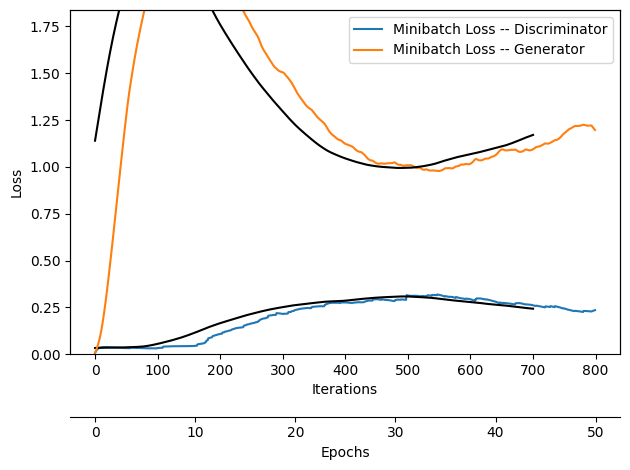

In [43]:
plot_multiple_training_losses(
    losses_list=(log_dict_gan['train_discriminator_loss_per_batch'],
                 log_dict_gan['train_generator_loss_per_batch']),
    num_epochs=GAN_EPOCHS, 
    custom_labels_list=(' -- Discriminator', ' -- Generator')
)
plt.show()

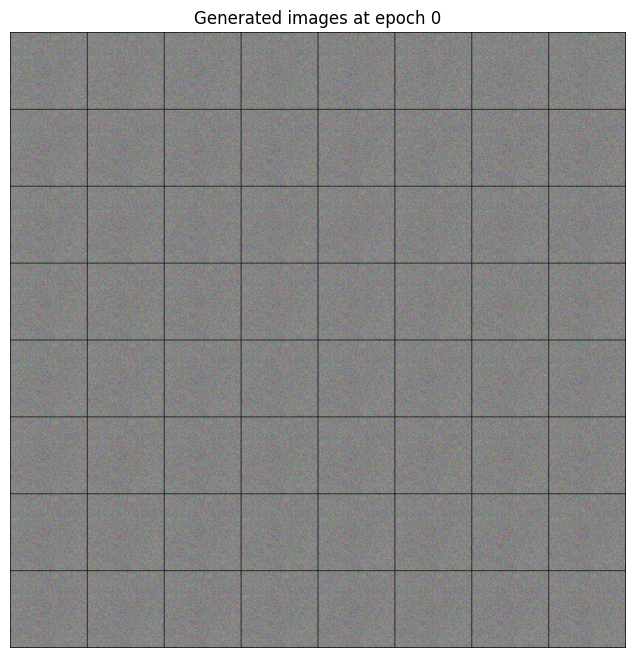

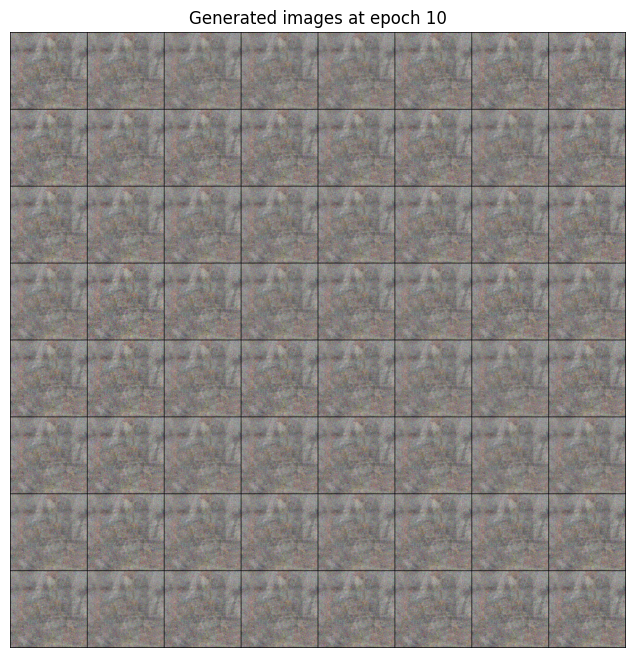

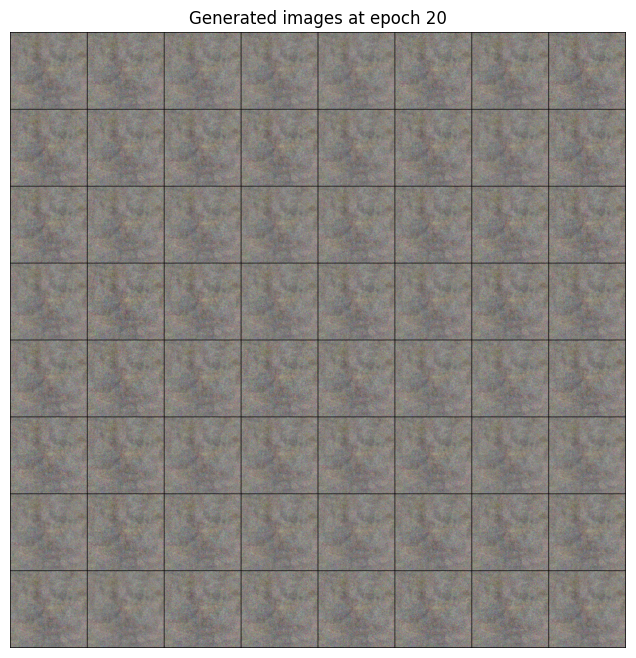

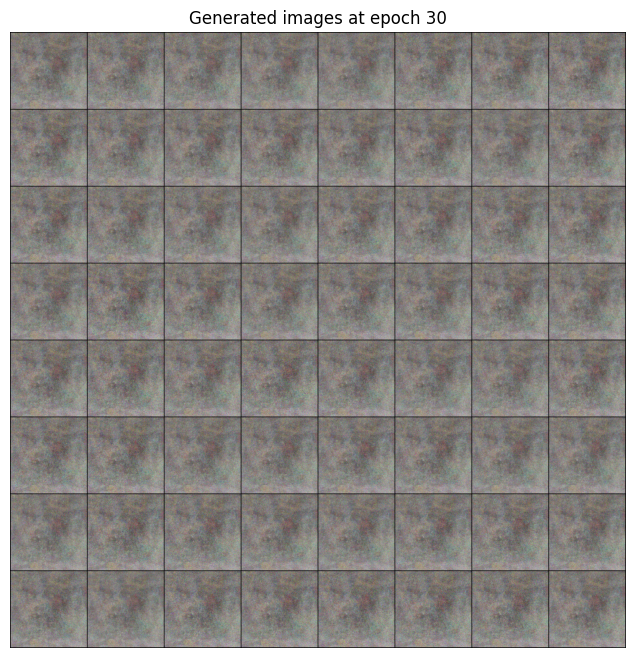

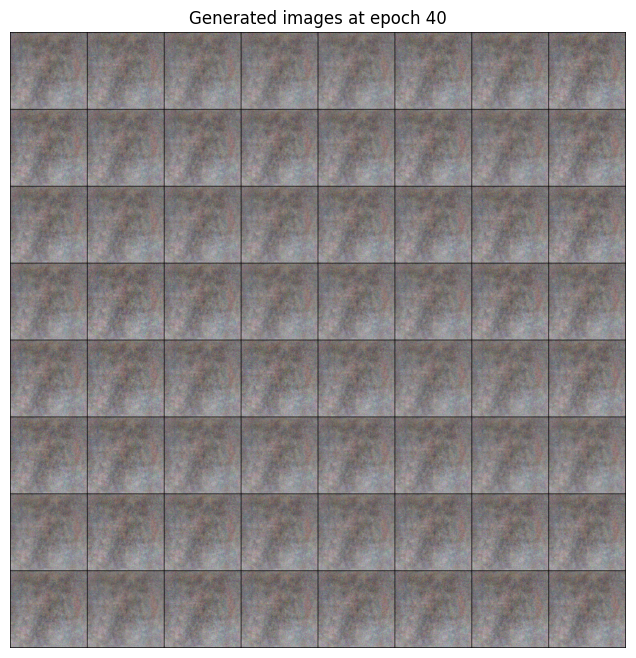

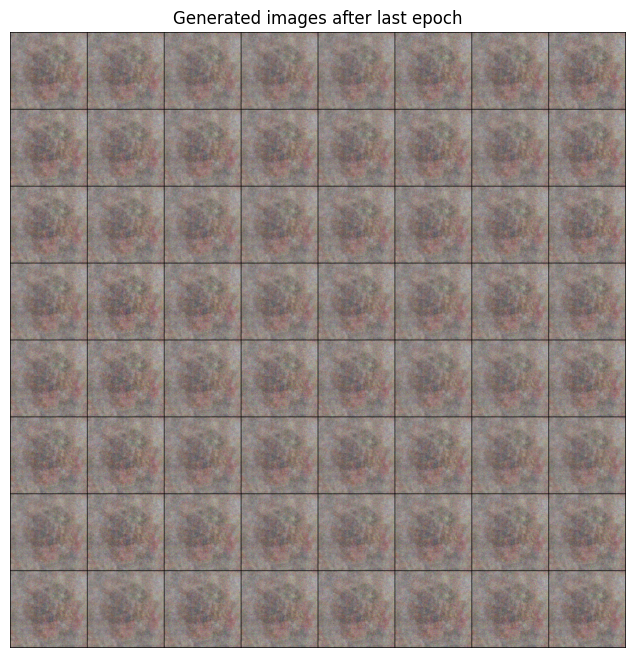

In [44]:
##########################
### VISUALIZATION
##########################

for i in range(0, GAN_EPOCHS, 10):
    
    plt.figure(figsize=(8, 8))
    plt.axis('off')
    plt.title(f'Generated images at epoch {i}')
    plt.imshow(np.transpose(log_dict_gan['images_from_noise_per_epoch'][i], (1, 2, 0)))
    plt.show()
    
    
plt.figure(figsize=(8, 8))
plt.axis('off')
plt.title(f'Generated images after last epoch')
plt.imshow(np.transpose(log_dict_gan['images_from_noise_per_epoch'][-1], (1, 2, 0)))
plt.show()

It was hard to work on the GAN, as the training takes a long time, so tuning hyperparamaters with epochs that make sense would take hours to complete. Experimenting with Batch Normalization and Deep Convolutional Layers also resulted in poor results, unsure if from using them wrong or having the wrong hyperparameters.

# **Conclusion** <a id="conc"></a>

In conclusion, the models are not great at generating new images, mostly as it would take a long time to tune the hyperparameters and the models might not be dense enough for the images.